## Initial Analysis of Gulf Stream Cruise Data from Sept Cruise (Sept 4-9)

In [1]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

import hvplot.xarray


import cartopy.crs as crs

import pandas as pd
import glob
import hvplot.pandas  # noqa
from datetime import timedelta
from datetime import datetime

#### Pull in CDOM data and ship TSG/GPS data

In [2]:
path = 'data/sept_cruise/wscd859/' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df_tmp = pd.read_csv(filename, index_col=None, header=1)
    li.append(df_tmp)
cdom_df = pd.concat(li, axis=0, ignore_index=True)

cdom_df['utc_dt'] = pd.to_datetime(cdom_df['yyyy/mm/dd HH:MM:SS.fff'])

cdom_df = cdom_df.set_index('utc_dt')

df = pd.read_csv("data/sept_cruise/SW21011R_RFP/EventData/DataLogger/Data every 1 min_001.elg")
df.head()

,Date,Time,SW-ZDA-Year,SW-ZDA-Month,SW-ZDA-Day,SW-ZDA-Time,SW-GGA-Lat,SW-GGA-NorS,SW-GGA-Long,SW-GGA-EorW,...,SW-Weather-HumidRel-%,SW-Wind-WindSpeedRel,SW-Wind-WindAngleRel,TrueWind-DRV-SPEED,TrueWind-DRV-DIRECTION,TSG--temp-SBE38,TSG--sal,SW-Depth-DBT-Depth below transducer (m),DepthOverall-DRV-VALUE,Unnamed: 24
0,09/04/2021,22:57:59,2021,9,4,230119.69,3438.0721,N,7639.5131,W,...,62.1,23.70,346.29,3.65,137.98,26.5469,36.0464,15.57,16.57,NaN
1,09/04/2021,22:58:59,2021,9,4,230220.00,3437.7653,N,7639.3397,W,...,62.6,23.70,347.29,0.92,120.30,26.5202,35.9130,16.51,17.51,NaN
2,09/04/2021,22:59:59,2021,9,4,230319.70,3437.4662,N,7639.1743,W,...,62.0,19.98,344.39,1.74,100.41,26.7050,35.9890,16.34,17.34,NaN
3,09/04/2021,23:00:59,2021,9,4,230420.70,3437.1706,N,7639.0156,W,...,63.8,23.09,346.09,4.72,123.35,26.7135,36.0296,16.23,17.23,NaN
4,09/04/2021,23:01:59,2021,9,4,230520.70,3436.8780,N,7638.8561,W,...,63.5,23.38,348.79,4.31,152.50,26.8741,36.0758,16.52,17.52,NaN


In [3]:
cdom_df.head()

,yyyy/mm/dd HH:MM:SS.fff,V
utc_dt,,
2021-09-05 11:38:44.834,2021/09/05 11:38:44.834,0.139
2021-09-05 11:38:45.834,2021/09/05 11:38:45.834,0.141
2021-09-05 11:38:46.834,2021/09/05 11:38:46.834,0.140
2021-09-05 11:38:47.834,2021/09/05 11:38:47.834,0.140
2021-09-05 11:38:48.834,2021/09/05 11:38:48.834,0.140


In [4]:
# This first one is the right way to do this

In [5]:
# date_time_strs = df['SW-ZDA-Year'].astype('str') + ' ' + df['SW-ZDA-Month'].astype('str') + ' ' + df['SW-ZDA-Day'].astype('str') + ' ' + df['SW-ZDA-Time'].astype('str').str[:-2].str.replace('.','')

# df['datetime'] = [datetime.strptime(x, '%Y %m %d %H%M%S') for x in date_time_strs]
# df['utc_dt'] = df['datetime']
# df  = df.set_index('utc_dt')

In [6]:
date_time_strs = df['Date'] + ' ' + df['Time']

df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S') for x in date_time_strs]
df['utc_dt'] = df['datetime']+ timedelta(minutes=4)
df  = df.set_index('utc_dt')

In [7]:
def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

df['lon'] = dms2dd(pd.to_numeric(df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
df['lat'] = dms2dd(pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')

<AxesSubplot:>

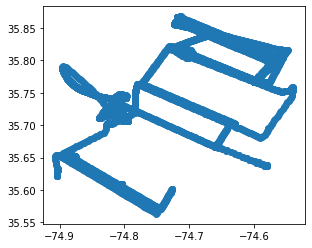

In [8]:
import geopandas as gpd

gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat))
gdf.loc['2021-09-5 11:00:00':'2021-09-8 20:45:00'].plot()

#### Visualizing SST from GOES

In [9]:
goes_ds = xr.open_dataset('data/jplStarG16SSTv270_8997_d932_2101.nc')

/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/conventions.py:512: SerializationWarning: variable 'sea_surface_temperature' has multiple fill values {-327.67, -327.68}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


In [10]:
goes_ds.sea_surface_temperature[:,:, :].resample(time="6H", skipna=True).mean().hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

In [11]:
goes_ds.sea_surface_temperature[:,:, :].resample(time="1D", skipna=True).mean().hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

In [12]:
goes_ds.sea_surface_temperature[:,:, :].hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

<GeoAxesSubplot:title={'center':'time = 2021-08-19T04:00:00'}, xlabel='Longitude [degrees_east]', ylabel='Latitude [degrees_north]'>

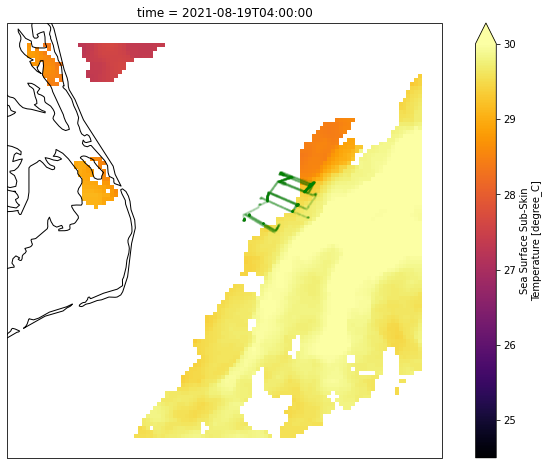

In [13]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[100,75:175, 100:200].plot(ax=ax, vmin=24.5, vmax=30, cmap='inferno')
gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

In [14]:
plt.rcParams.update({'font.size': 16})

### Visualizing the CDOM/Ship Data

In [17]:
# gdf.reset_index().drop(columns=['datetime', 'utc_dt']).to_file('compass_cruise.shp')

In [18]:
df.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05,tiles='EsriNatGeo')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

<ipython-input-19-df14b368788f>:2: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  cdom_df.loc['2021-09-5 11:00:00':'2021-09-9 18:30:00'].rolling(window=60).mean().plot(y=' V', ax=ax)


(0.05, 0.5)

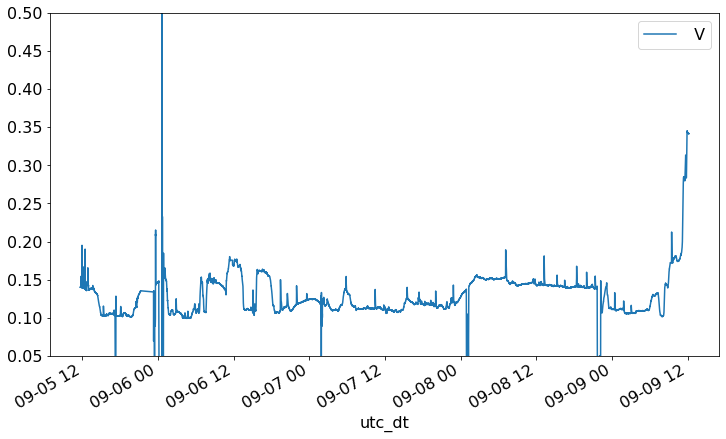

In [19]:
fig,ax = plt.subplots(figsize=(12,7))
cdom_df.loc['2021-09-5 11:00:00':'2021-09-9 18:30:00'].rolling(window=60).mean().plot(y=' V', ax=ax)
ax.set_ylim(0.05,.5)

In [20]:
df.loc['2021-09-5 13:00:00':'2021-09-5 17:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05,tiles='EsriNatGeo')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

## Working through each transect with data and SST

<GeoAxesSubplot:title={'center':'time = 2021-08-19T04:00:00'}, xlabel='Longitude [degrees_east]', ylabel='Latitude [degrees_north]'>

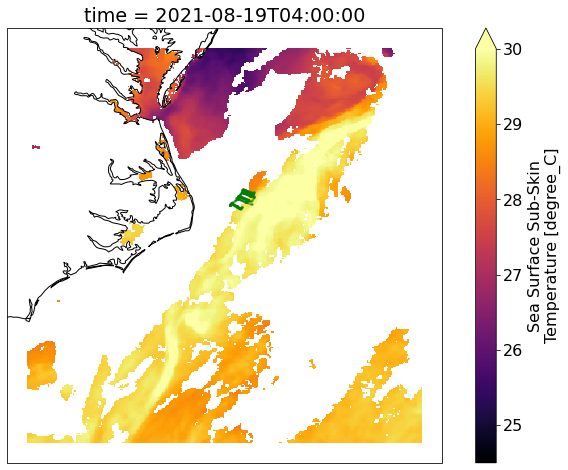

In [21]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[100,:, :].plot(ax=ax, vmin=24.5, vmax=30, cmap='inferno')
gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

In [23]:
plt.rcParams.update({'font.size': 16})

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


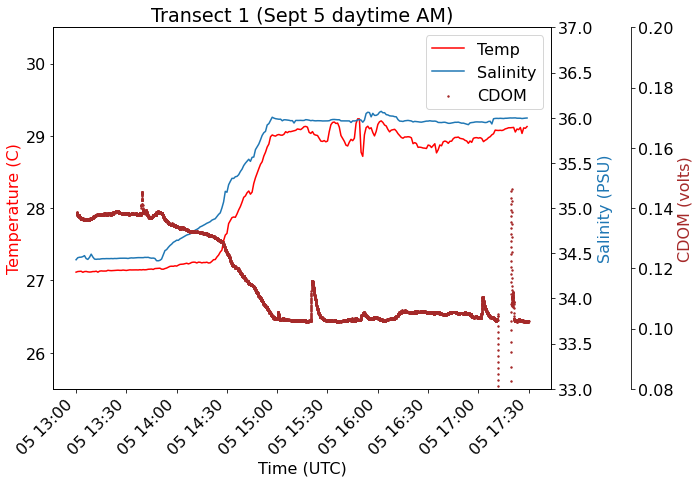

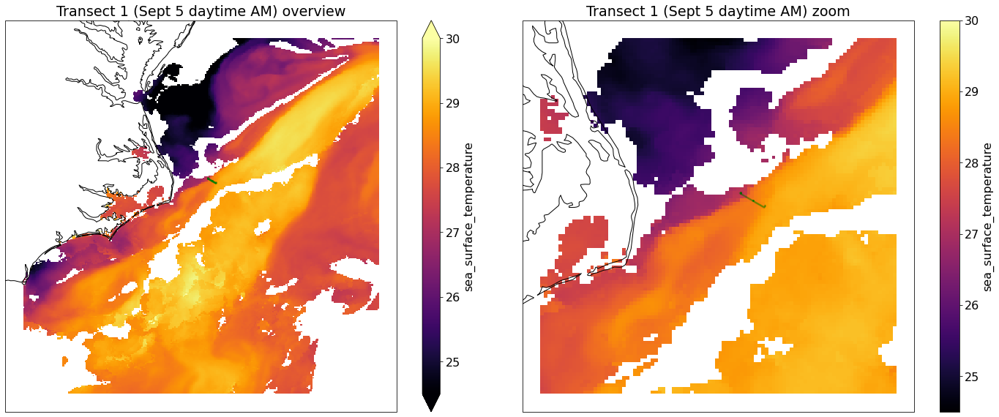

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


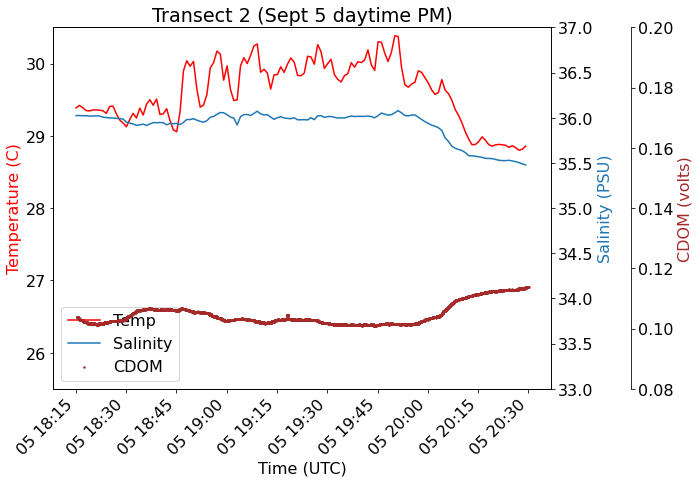

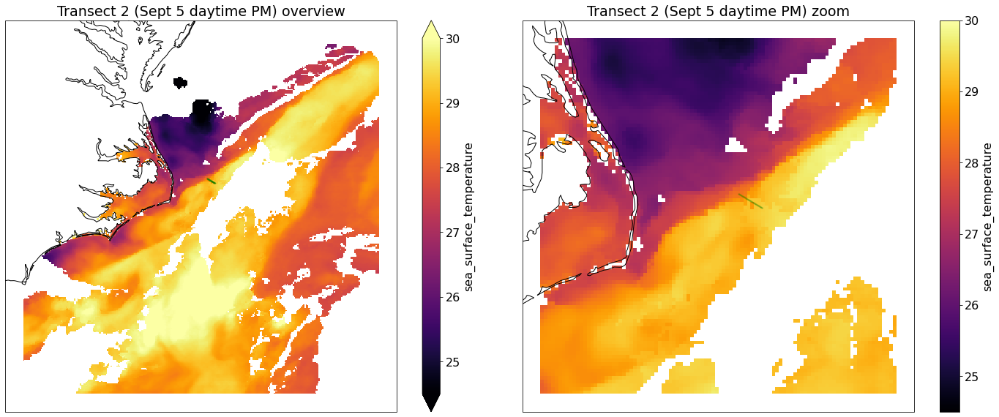

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


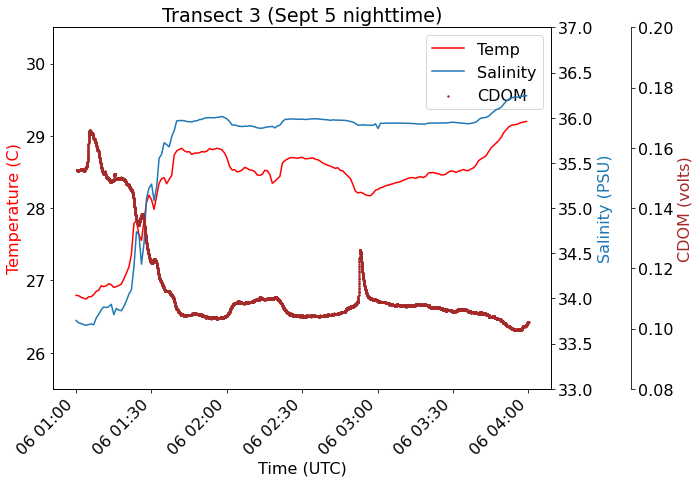

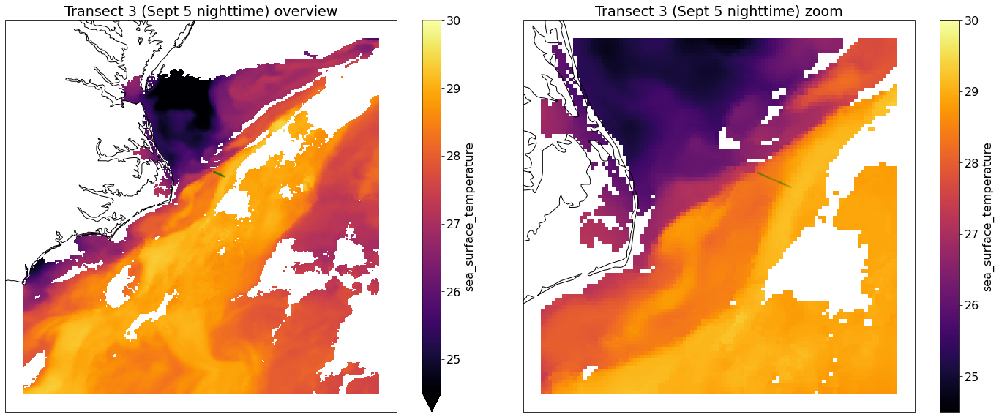

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


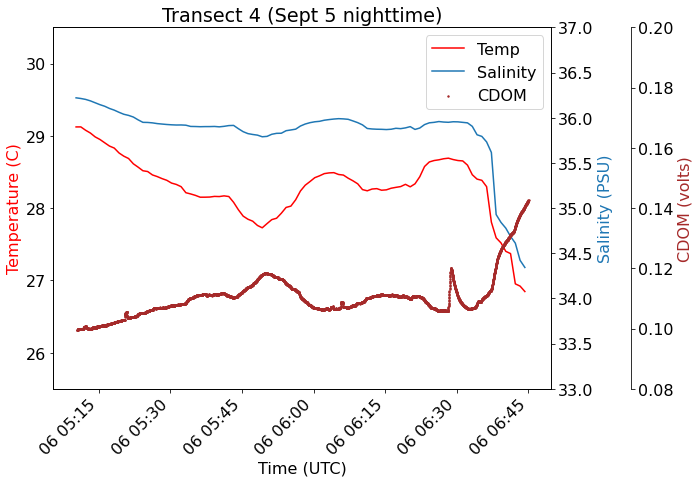

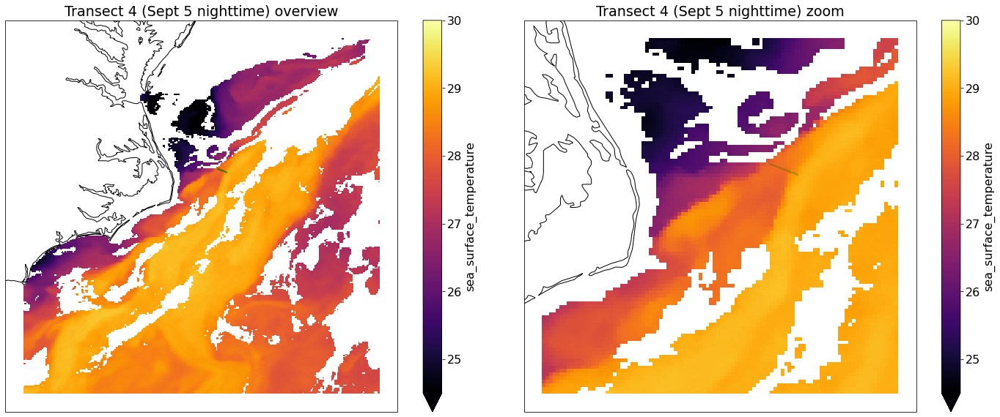

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


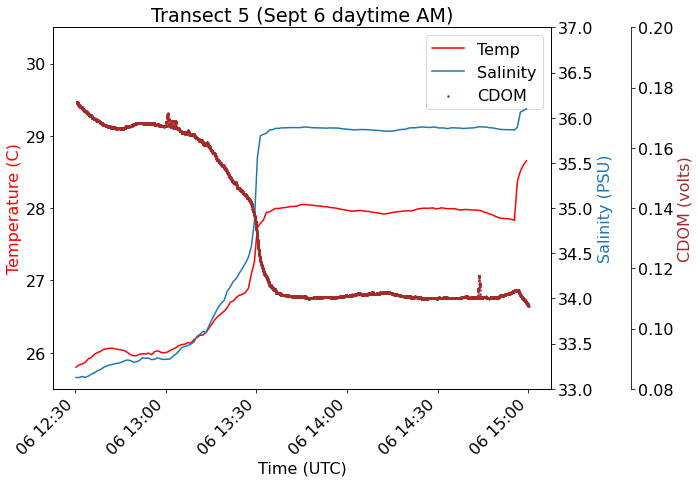

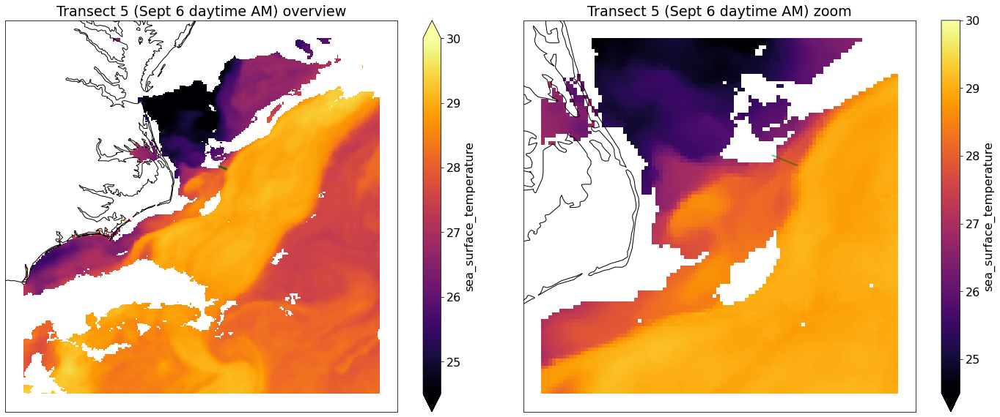

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


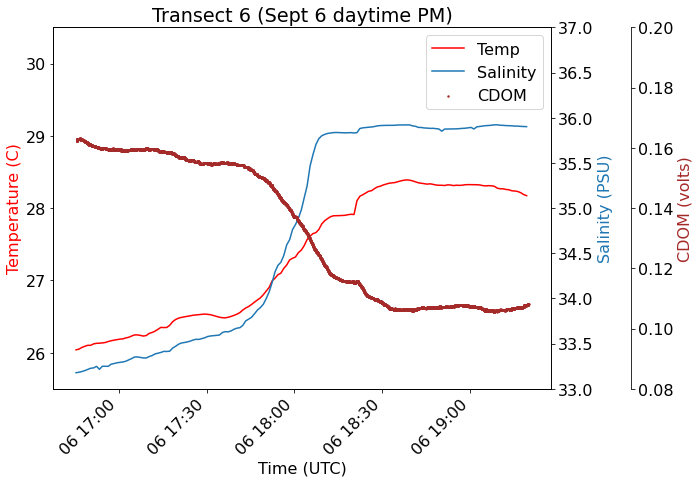

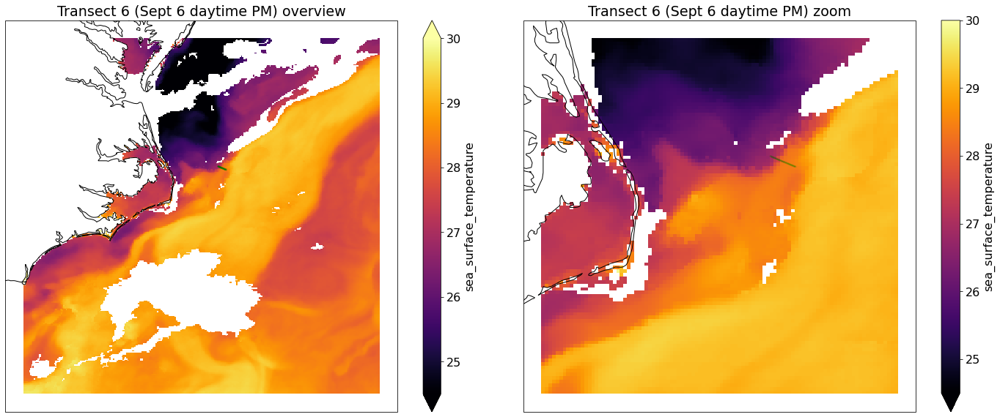

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


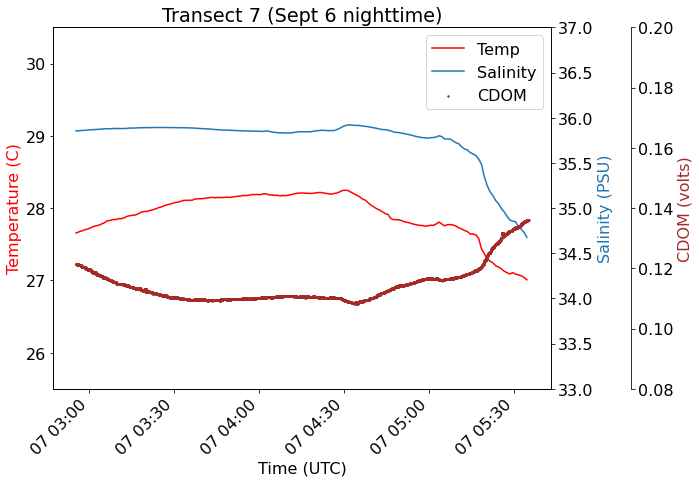

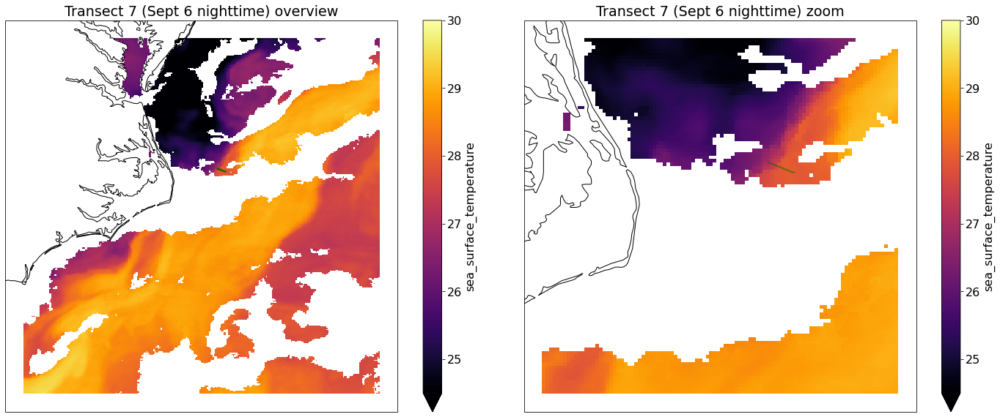

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


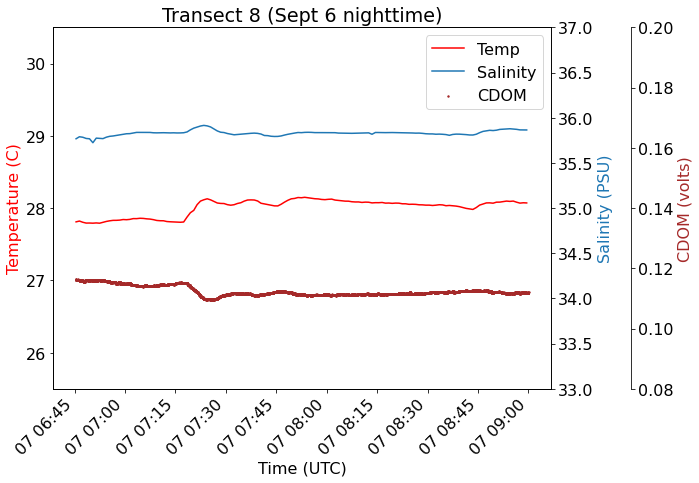

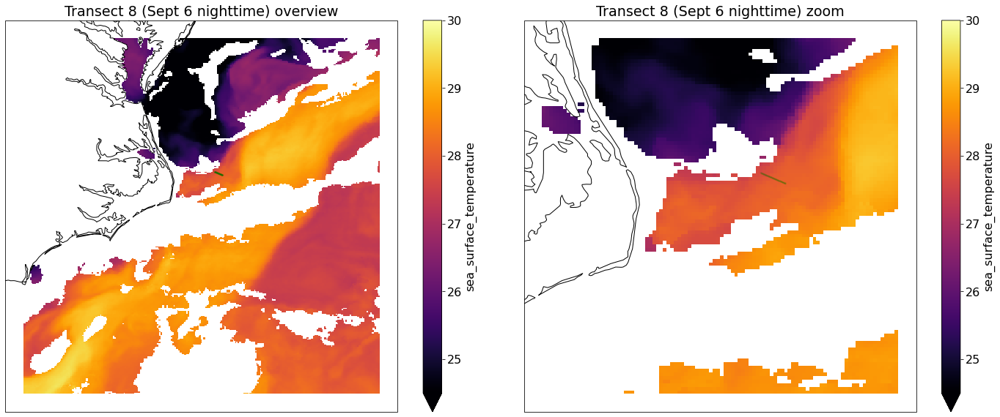

<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-29-ecb718d91422>:31: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


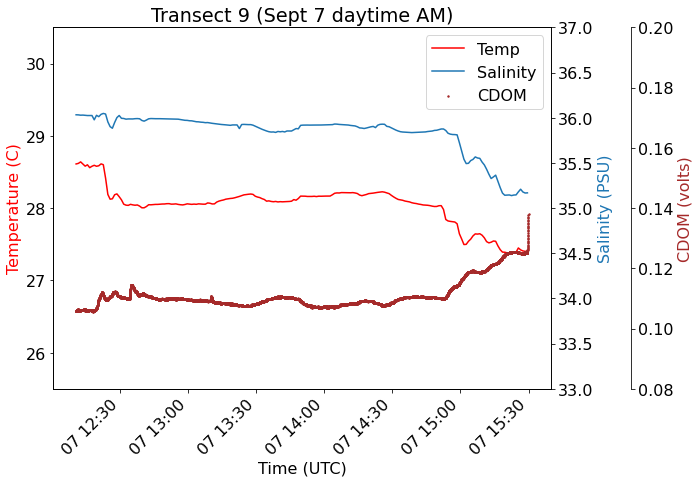

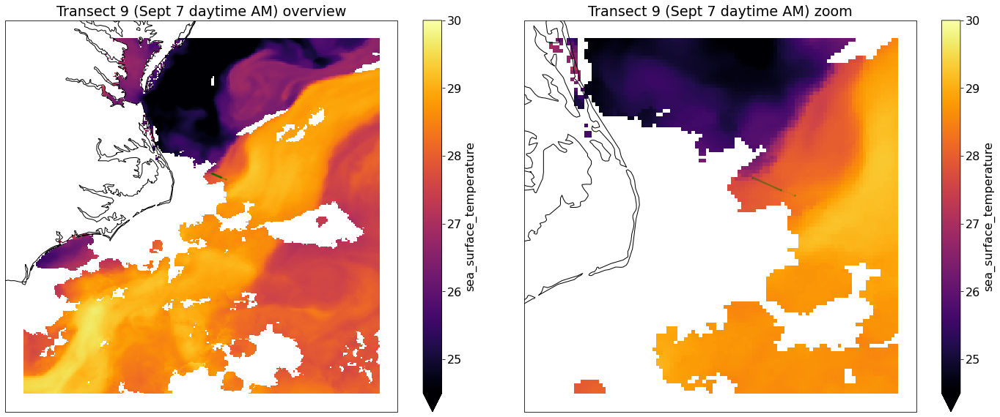

In [29]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']
hours = [0,0,0,0,0,0,0,0,0]

titles = ['Transect 1 (Sept 5 daytime AM)', 'Transect 2 (Sept 5 daytime PM)', 'Transect 3 (Sept 5 nighttime)', 'Transect 4 (Sept 5 nighttime)', 
        'Transect 5 (Sept 6 daytime AM)', 'Transect 6 (Sept 6 daytime PM)', 'Transect 7 (Sept 6 nighttime)', 'Transect 8 (Sept 6 nighttime)',
        'Transect 9 (Sept 7 daytime AM)']

for i in range(9):
    # time series plot
    fig, ax = plt.subplots(figsize=(10,7))
    
    ax1 = ax.twinx()
    ax2 = ax.twinx()

    ax.set_ylim(25.5, 30.5)
    ax1.set_ylim(33, 37)
    ax2.set_ylim(.08, .2)

    ax.set_xlabel("Time (UTC)")
    ax.set_ylabel("Temperature (C)")
    ax1.set_ylabel("Salinity (PSU)")
    ax2.set_ylabel("CDOM (volts)")

    color1 = plt.cm.viridis(0)
    color2 = plt.cm.viridis(0.5)
    color3 = plt.cm.viridis(.9)
    
    p1, = ax.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], color='red', label='Temp')
    p2, = ax1.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--sal'], label='Salinity')
    p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
    
    ax.set_title(titles[i])


#     p1, = ax.plot([0, 1, 2], [0, 1, 2],    color=color1, label="Density")
#     p2, = ax1.plot([0, 1, 2], [0, 3, 2],    color=color2, label="Temperature")
#     p3, = ax2.plot([0, 1, 2], [50, 30, 15], color=color3, label="Velocity")

    lns = [p1, p2, p3]
    ax.legend(handles=lns, loc='best')

    # right, left, top, bottom
    ax2.spines['right'].set_position(('outward', 80))

    # no x-ticks                 
#     ax2.xaxis.set_ticks([])
    fig.autofmt_xdate(rotation=45)

    # Sometimes handy, same for xaxis
    #par2.yaxis.set_ticks_position('right')

    # Move "Velocity"-axis to the left
    # par2.spines['left'].set_position(('outward', 60))
    # par2.spines['left'].set_visible(True)
    # par2.yaxis.set_label_position('left')
    # par2.yaxis.set_ticks_position('left')

    ax.yaxis.label.set_color(p1.get_color())
    ax1.yaxis.label.set_color(p2.get_color())
    ax2.yaxis.label.set_color('brown')

    # Adjust spacings w.r.t. figsize
    fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'.png')
#     plt.close()
    plt.show()
    
    
    
    # SST image
    
    fig, ax = plt.subplots(1,2, figsize=(20,8), subplot_kw=dict(projection=crs.PlateCarree()))
    ax[0].coastlines(resolution='10m')
    goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,:,:].mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
    gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[0], markersize=2, color='green', alpha=.05)
    
    ax[1].coastlines(resolution='10m')
    goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,75:175, 100:200].mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')
    gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[1], markersize=2, color='green', alpha=.05)
    # fig.savefig('sst_sept0523_studypoints.png',dpi=400)
    ax[0].set_title(titles[i] + ' overview')
    ax[1].set_title(titles[i] + ' zoom')
    fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()
    plt.show()

    # fig.savefig('transect' + str(i) '_s_t.png')